In [386]:
import datetime
import os

import matplotlib.pyplot as plt
import numpy as np

from sentinelhub import (
    CRS,
    BBox,
    DataCollection,
    DownloadRequest,
    MimeType,
    MosaickingOrder,
    SentinelHubDownloadClient,
    SentinelHubRequest,
    bbox_to_dimensions,
    SHConfig
)

from sentinelhub import data_utils

# The following is not a package. It is a file utils.py which should be in the same folder as this notebook.
from utils import plot_image

In [26]:
config = SHConfig()
config.instance_id = "205b4fe3-52a0-40fb-82d8-5370549af54c"
config.sh_client_id = "7e510e97-495e-4e94-8a87-b191a584c770"
config.sh_client_secret = "l9A0pvMDxve5XawVQaQa9KlWTp9uu4Pt"
# config.sh_base_url = 'https://sh.dataspace.copernicus.eu'
# config.sh_token_url = 'https://identity.dataspace.copernicus.eu/auth/realms/CDSE/protocol/openid-connect/token'

In [316]:
chennai_area_of_interest = (80.0, 13.15, 80.31, 12.95)
# chennai_area_of_interest = (75.793249, 12.355692, 78.006451, 10.629158) # ghats - coimbatore
# chennai_area_of_interest = (79.137944, 12.969983, 79.155040, 12.955318) # vellore
# chennai_area_of_interest = (79.511335, 13.399165, 80.479952, 12.513554)
# chennai_area_of_interest = (46.16, -16.15, 46.51, -15.58)
# chennai_area_of_interest = (68.418218, 22.717214, 87.246142, 7.468449) # india

In [323]:
resolution = 15
chennai_bbox = BBox(chennai_area_of_interest, crs=CRS.WGS84)
chennai_size = bbox_to_dimensions(chennai_bbox, resolution=resolution)

In [324]:
print(f"Image shape at {resolution} m resolution: {chennai_size} pixels")

Image shape at 15 m resolution: (2246, 1467) pixels


In [334]:
evalscript_true_color = """
    //VERSION=3

    function setup() {
        return {
            input: [{
                bands: ["B03", "B04", "B02"]
            }],
            output: {
                bands: 3
            }
        };
    }

    function evaluatePixel(sample) {
        return [sample.B04, sample.B03, sample.B02];
    }
"""

request_true_color = SentinelHubRequest(
    evalscript=evalscript_true_color,
    input_data=[
        SentinelHubRequest.input_data(
            data_collection=DataCollection.SENTINEL2_L1C,
            time_interval=("2023-01-01", "2024-02-02"),
            mosaicking_order=MosaickingOrder.LEAST_CC,
        )
    ],
    responses=[SentinelHubRequest.output_response("default", MimeType.PNG)],
    bbox=chennai_bbox,
    size=chennai_size,
    config=config,
)

In [335]:
evalscript_all_bands = """
    //VERSION=3
    function setup() {
        return {
            input: [{
                bands: ["B01","B02","B03","B04","B05","B06","B07","B08","B8A","B09","B10","B11","B12"],
                units: "DN"
            }],
            output: {
                bands: 13,
                sampleType: "INT16"
            }
        };
    }

    function evaluatePixel(sample) {
        return [sample.B01,
                sample.B02,
                sample.B03,
                sample.B04,
                sample.B05,
                sample.B06,
                sample.B07,
                sample.B08,
                sample.B8A,
                sample.B09,
                sample.B10,
                sample.B11,
                sample.B12];
    }
"""

request_all_bands = SentinelHubRequest(
    evalscript=evalscript_all_bands,
    input_data=[
        SentinelHubRequest.input_data(
            data_collection=DataCollection.SENTINEL2_L1C,
            time_interval=("2023-01-01", "2024-02-02"),
            mosaicking_order=MosaickingOrder.LEAST_CC,
        )
    ],
    responses=[SentinelHubRequest.output_response("default", MimeType.TIFF)],
    bbox=chennai_bbox,
    size=chennai_size,
    config=config,
)

In [336]:
true_color_images = request_true_color.get_data()

In [337]:
all_bands_images = request_all_bands.get_data()

# True Colors

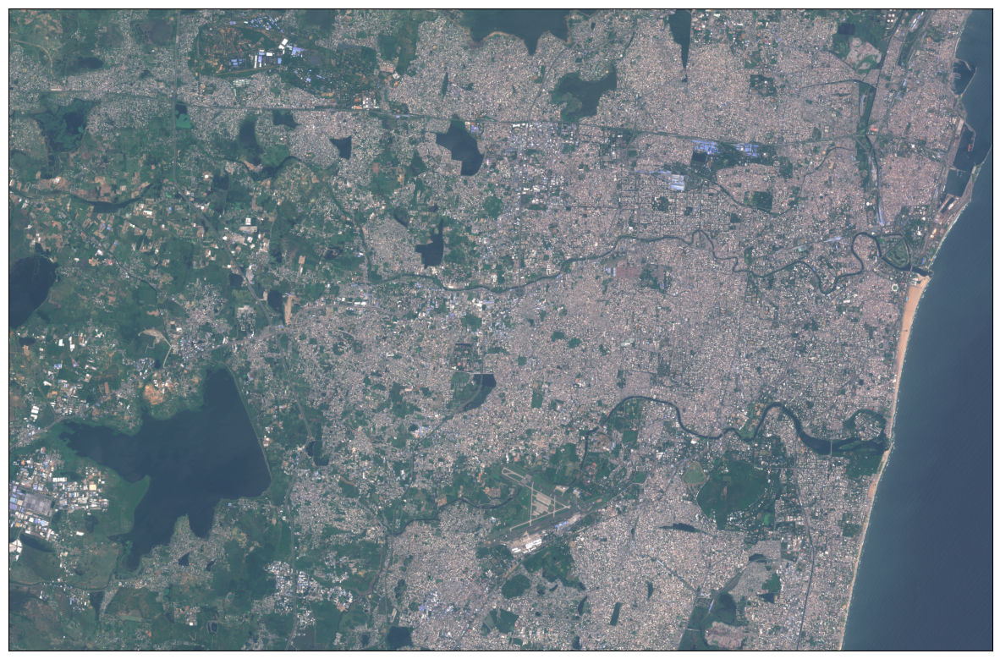

In [387]:
image = true_color_images[0]
plot_image(image, factor=3.5/255, clip_range=(0,1))

# Band 8

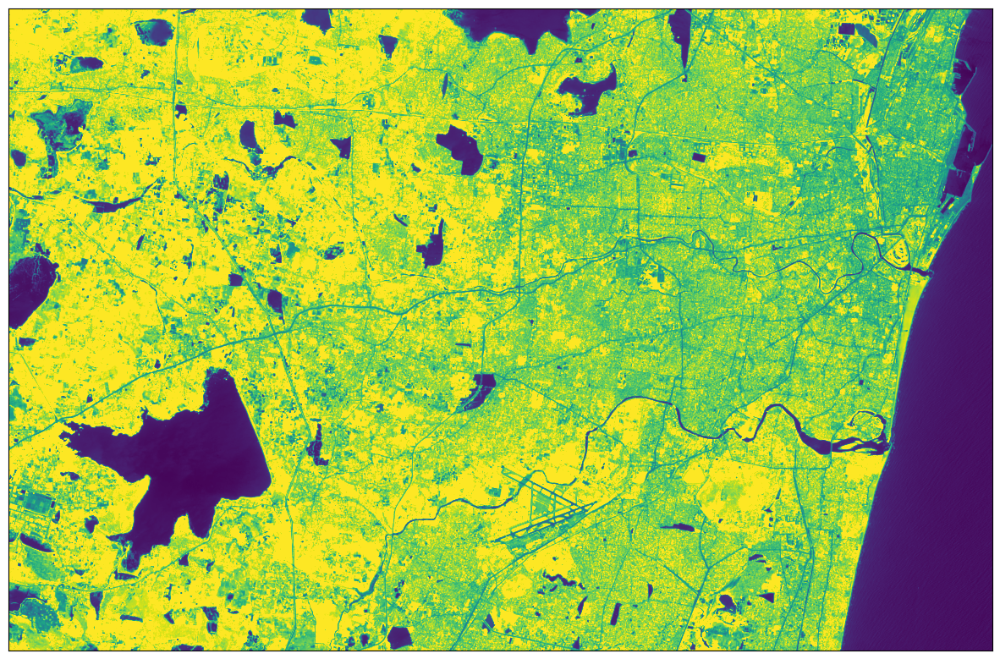

In [392]:
band8 = all_bands_images[0][:, :, 7]
band4 = all_bands_images[0][:, :, 3]
plot_image(band8, factor=3.5/1e4, vmax=1)

# Band 4

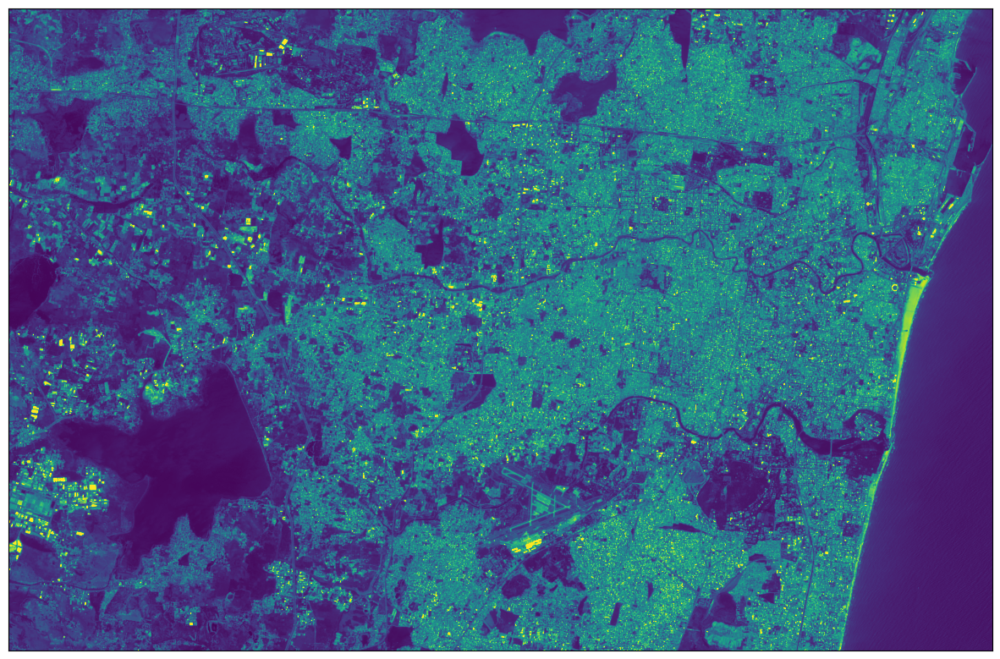

In [393]:
plot_image(band4, factor=3.5/1e4, vmax=1)

# NDVI

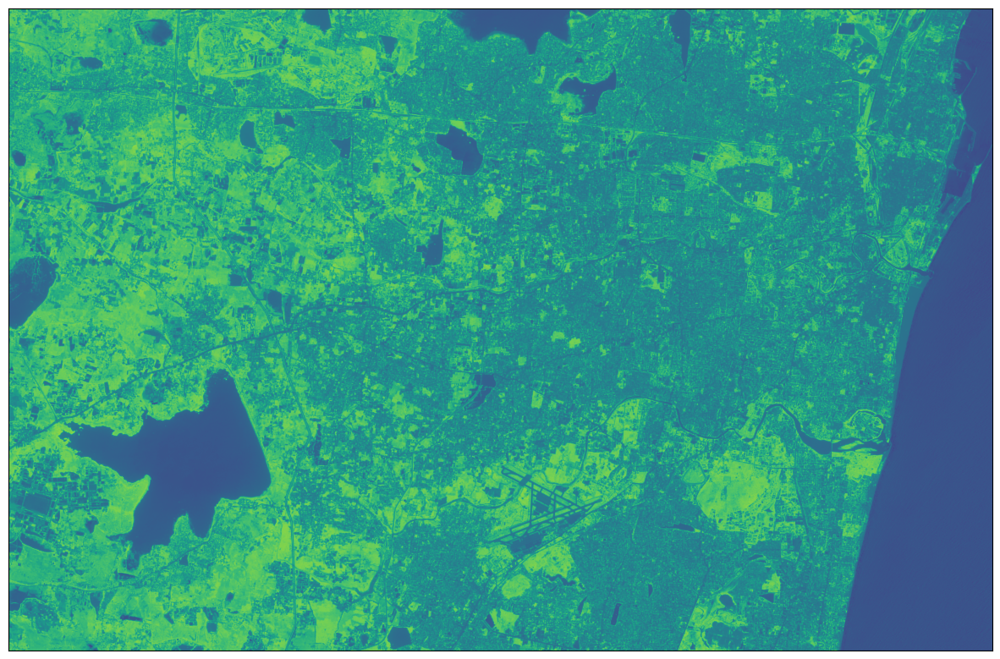

In [394]:
ndvi = (band8-band4) / (band8 + band4)
plot_image(ndvi, vmax=1)

# Proposed band selection

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


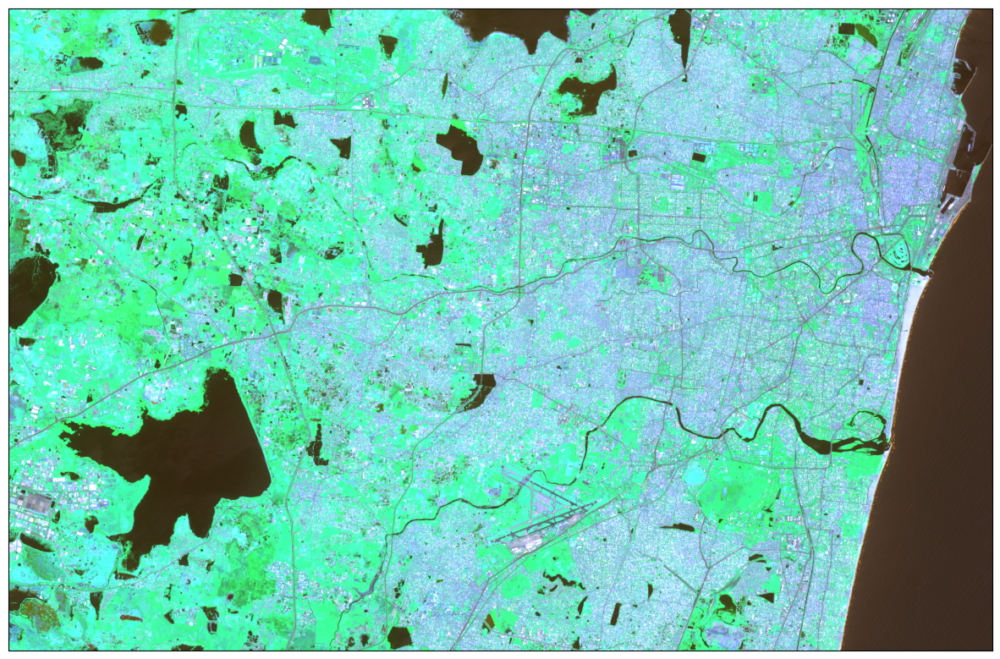

In [395]:
plot_image(all_bands_images[0][:, :, [3, 7, 11]], factor=3.5/1e4, vmax=1)